# **- Unsupervised Learning**
During this phase , I choose to use clustered method because it is a powerful technique used in the unsupervised phase of data analysis. It involves grouping similar data points together based on their inherent characteristics or patterns, without the need for predefined labels or target variables. By using clustering algorithms such as k-means, hierarchical clustering, or density-based clustering, the data can be organized into distinct clusters or groups. This approach enables the identification of hidden patterns, similarities, or anomalies within the data, leading to a deeper understanding of its underlying structure. The clustered method is widely employed in various domains, including customer segmentation, image recognition, anomaly detection, and recommendation systems, as it allows for the exploration and extraction of valuable insights from unstructured or unlabeled data.


# **- K-means clustering**
Clustering involves the task of categorizing data points based on their similarities. Initially, I prepared the data for clustering by ensuring it was properly formatted and scaled. I then applied the k-means algorithm, which randomly selects k objects as initial cluster centers and assigns data points to the closest center. To enhance the quality of the clusters, i iteratively updated the cluster centers by recalculating their positions based on the assigned data points and reassigned the items to the new center. In my analysis, I utilized the k-means() function to partition my dataset into distinct groups.

# **-  Evaluation**
The silhouette method is a valuable approach for assessing the cohesion and separation of clusters in data analysis. It offers a concise visual depiction of the effectiveness of clustering by illustrating the degree to which each object has been accurately classified. By calculating silhouette scores, which take into account both intra-cluster similarity and inter-cluster dissimilarity, i can evaluate the overall quality and consistency of the clustering results. This method provides a valuable tool for validating the appropriateness of the clustering algorithm and aids in the interpretation of the clustering output.

# **Import the necessary libraries**


In [ ]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [ ]:
# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/pre_advertisment(after2) .csv')

# **Start of Preparation**

In [ ]:
#Separated numeric features from categorical ones, which allowed for a more efficient analysis.
df.loc[df['Male'] == 1, 'Male'] = 'Male' 
df.loc[df['Male'] == 0, 'Male'] = 'Femal'

df.loc[df['Clicked on Ad'] == 1, 'Clicked on Ad'] = 'Clicked' 
df.loc[df['Clicked on Ad'] == 0, 'Clicked on Ad'] = 'Not clicked'

df = df.rename(columns = {'Male':'Gender',
                          'Daily Time Spent on Site':'Daily Time Spent on Site', 
                          'Age':'Age',
                          'Area Income':'Area Income',
                          'Daily Internet Usage':'Daily Internet Usage',
                          'Ad Topic Line':'Ad Topic Line',
                          'City':'City',
                          'Country':'Country',
                          'Timestamp':'Timestamp',
                          'Clicked on Ad':'Clicked on Ad',
                          'Internet usage bucket':'Internet usage bucket'})


In [ ]:
Cat_vars = []
Num_vars = []

for col in list(df.columns):
    if ((df[col].dtype == 'float64') | (df[col].dtype == 'int64')) & (df[col].nunique() > 10):
        Num_vars.append(col)
    
    else: Cat_vars.append(col)

Cat_vars.remove('Clicked on Ad')

In [ ]:
print(Num_vars)

['Unnamed: 0', 'Daily Time Spent on Site', 'Age', 'Area Income', 'Daily Internet Usage']


In [ ]:
x = df.drop('Clicked on Ad', axis = 1)
y = df['Clicked on Ad']
x = 0.6123

In [ ]:
#The train_test_split class of sklearn.model_selection is used for creating training and test split.
from sklearn.model_selection import train_test_split 
#70% data should be in the training tests so test_size = 0.3.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101) 

**Visualising variables**

1- Exploring variables on their own

During this phase, my emphasis was on investigating the correlations between the features and the target variable. However, before delving into more intricate relationships, I deemed it essential to gain a deeper understanding of the individual variables themselves. By examining the characteristics, distributions, and properties of each variable, I aimed to uncover valuable insights that could inform subsequent analyses and help uncover more nuanced connections between the variables and the target.

In [ ]:
df[Num_vars].describe().T.round(1)

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,1000.0,499.5,288.8,0.0,249.8,499.5,749.2,999.0
Daily Time Spent on Site,1000.0,65.0,15.9,32.6,51.4,68.2,78.5,91.4
Age,1000.0,36.0,8.8,19.0,29.0,35.0,42.0,61.0
Area Income,1000.0,55000.0,13414.6,13996.5,47031.8,57012.3,65470.6,79484.8
Daily Internet Usage,1000.0,180.0,43.9,104.8,138.8,183.1,218.8,270.0


<ipython-input-98-6967449a43b8>:41: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(ax = ax_2[col_no, 2], x = df['Clicked on Ad'],
<ipython-input-98-6967449a43b8>:41: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(ax = ax_2[col_no, 2], x = df['Clicked on Ad'],
<ipython-input-98-6967449a43b8>:41: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(ax = ax_2[col_no, 2], x = df['Clicked on Ad'],
<ipython-input-98-6967449a43b8>:41: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(ax = ax_2[col_no, 2], x = df['Clicked on Ad'],
<ipython-input-98-6967449a43b8>:41: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(ax = ax_2[col_no, 2], x = df['Clicked on Ad'],


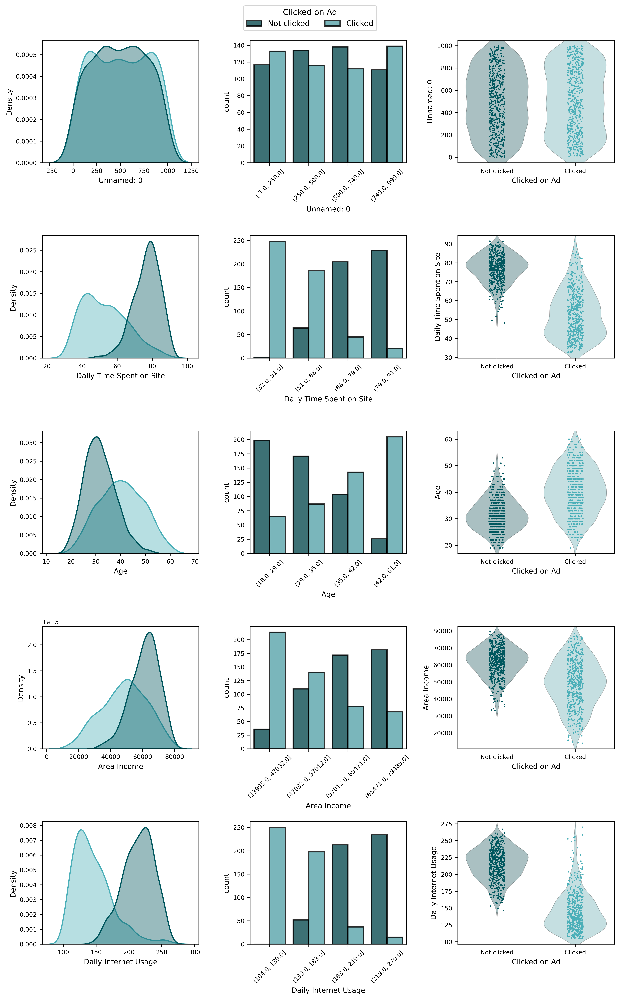

In [ ]:
with plt.rc_context(rc = {'figure.dpi': 500, 'axes.labelsize': 9, 
                          'xtick.labelsize': 7.5, 'ytick.labelsize': 7.5}):

    fig_2, ax_2 = plt.subplots(5, 3, figsize = (11, 17))
    
    col_no = 0

    for column in Num_vars:
        
        ### KDE plots
    
        sns.kdeplot(ax = ax_2[col_no, 0], x = df[column], 
                    hue = df['Clicked on Ad'],
                    common_norm = True,
                    fill = True, alpha = 0.4, palette = my_palette,
                    linewidth = 1.5)
        
        ax_2[col_no, 0].get_legend().remove()
        
        ### Quantile-based discretization
        
        cuts = pd.qcut(df[column], 4, precision = 0)
        
        sns.countplot(ax = ax_2[col_no, 1], x = cuts, 
                      hue = df['Clicked on Ad'], 
                      linewidth = 1.5, edgecolor = 'k', 
                      palette = my_palette, alpha = 0.8)
        
        ax_2[col_no, 1].get_legend().remove()
        
        plt.setp(ax_2[col_no, 1].get_xticklabels(), rotation = 45)
        
        #### Violinplots & stripplots
        
        sns.violinplot(ax = ax_2[col_no, 2], x = df['Clicked on Ad'], 
                       y = df[column], palette = my_palette, scale = 'width',
                       linewidth = 0.5, inner = None)
        
        plt.setp(ax_2[col_no, 2].collections, alpha = 0.35)
        
        sns.stripplot(ax = ax_2[col_no, 2], x = df['Clicked on Ad'], 
                      y = df[column], palette = my_palette, alpha = 1,
                      s = 1.8, jitter = 0.1)
        col_no += 1
    
    ### A global legend
    
    handles, labels = ax_2[4, 1].get_legend_handles_labels()
    fig_2.legend(handles, labels, loc = 'upper center', 
                 bbox_to_anchor = (0.5, 1.027), ncol = 2, 
                 fontsize = 9.5, title = 'Clicked on Ad', title_fontsize = 10)
    
    plt.tight_layout(pad = 1.5)
    plt.show()

**The figure above shows the following:**

Utilizing a kdeplot, along with a combined stripplot and violinplot, proved to be effective in gaining valuable insights into the numeric predictors. Additionally, employing variable binning through quantile-based discretization could further enhance my understanding of the dataset by revealing more general trends. Upon analyzing the aforementioned graphs, it becomes evident that elevated values of "Age," "Daily Time Spent on Site," and "AreaIncome" were associated with an increased likelihood of Clicked on Advertisement. This observation provides important evidence of the potential impact of these variables on the occurrence of the condition.

2- Exploring interactions between variables

2.1- Numeric variables

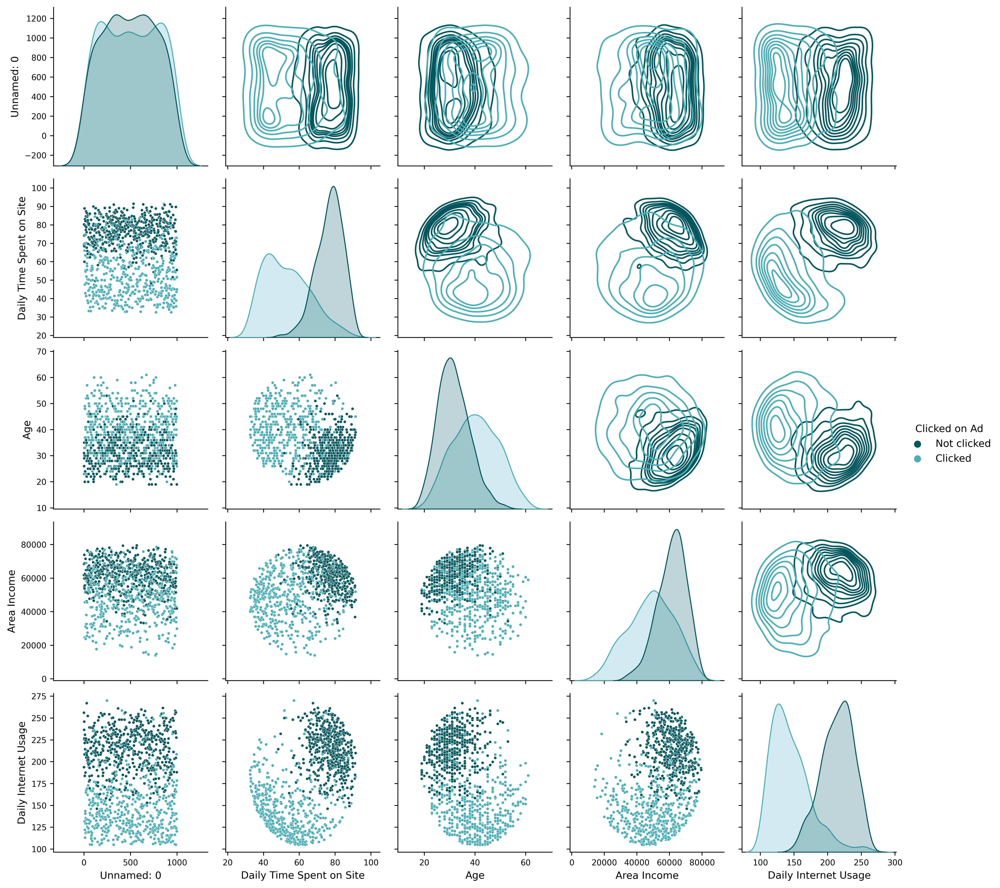

In [ ]:
Num_vars_target = Num_vars.copy()
Num_vars_target.append('Clicked on Ad')

with plt.rc_context(rc = {'figure.dpi': 400, 'axes.labelsize': 10, 
                          'xtick.labelsize': 8, 'ytick.labelsize': 8}):
    
    fig_4 = sns.PairGrid(df[Num_vars_target], diag_sharey = False,
                         hue = 'Clicked on Ad', palette = my_palette)
    
    fig_4.map_lower(sns.scatterplot, s = 8)
    
    fig_4.add_legend()
    
    fig_4.map_upper(sns.kdeplot)
    fig_4.map_diag(sns.kdeplot, fill = True)
    
    plt.show()

**The figure above shows the following:**

Upon closer examination, it is apparent that the majority of numeric features displayed relatively low levels of correlation. However, there were two notable exceptions, namely the pairs of predictors "Age" vs "Daily Time Spent on Site" and "Age" vs "Area Income". These particular combinations exhibited a stronger correlation compared to the other variables, indicating a potential relationship between age and both the daily time spent on the site and the area income. This finding suggests that age may play a significant role in influencing an individual's browsing habits and their socioeconomic status in the analyzed dataset.

# **Start of K-means clastering**

K-means clastering: The number of clusters was tuned using sum of squared distances of samples to their closest cluster center (SSE)

In [ ]:
def PCA_(df, Vars_list, n_components = 10):
    
    ### Scaling data
    
    scaler = StandardScaler()
    data_scaled = pd.DataFrame(scaler.fit_transform(df[Vars_list]), 
                               columns = df[Vars_list].columns)
    
    ### Initialising PCA
    
    pca = PCA(n_components = n_components)
    
    pca_fit = pca.fit(data_scaled)
    pca_transf = pca.transform(data_scaled)
    
    return pca_fit, pca_transf

PCA_results = PCA_(df, Num_vars, n_components = len(Num_vars))

In [ ]:
def K_means_claster_tuning(df, Vars_list, max_cluster = 10):
    
    ### Scaling data
    
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(df[Vars_list])
    
    ### Calculating inertia_ for each number of clusters
    
    SSE = []
    
    for cluster in range(1, max_cluster):
        kmeans = KMeans(n_clusters = cluster, init = 'k-means++', random_state = 999)
        kmeans.fit(data_scaled)
        SSE.append(kmeans.inertia_)
        
    df_plot = pd.DataFrame({'Cluster': range(1, max_cluster), 'SSE': SSE})
    
    return df_plot

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

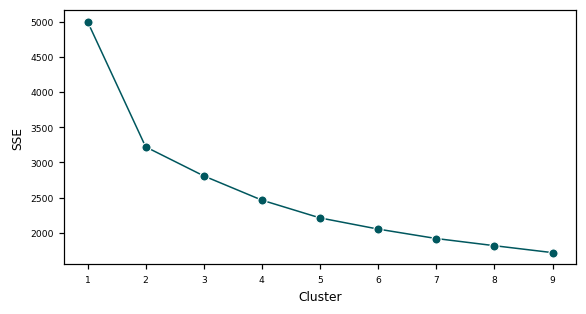

In [ ]:
Cluster_tuning_k_means = K_means_claster_tuning(df, Num_vars, max_cluster = 10)

with plt.rc_context(rc = {'figure.dpi': 110, 'axes.labelsize': 8, 
                          'xtick.labelsize': 6, 'ytick.labelsize': 6}):
    
    fig_8, ax_8 = plt.subplots(1, 1, figsize = (6, 3))

    sns.lineplot(x = Cluster_tuning_k_means['Cluster'].astype('int64'), 
                 y = Cluster_tuning_k_means['SSE'], color = '#00575e', 
                 marker = 'o', linewidth = 1)
    
    plt.xticks(range(1, 10))
          
    plt.show()

According to the graph, the optimal number of clusters was 2 because increasing it further did not show a significant decline in SSE.

In [ ]:
def Gaussian_mix_claster_tuning(df, Vars_list, max_cluster = 10):

    ### Setting initial parameters

    bic = []

    lowest_bic = np.infty
    n_components_range = range(1, max_cluster)
    
    ### Looping over n_components
    
    for n_components in n_components_range:
        gmm = GaussianMixture(n_components = n_components, covariance_type = 'full')
        gmm.fit(df[Vars_list])
        bic.append(gmm.bic(df[Vars_list]))
        
    return bic

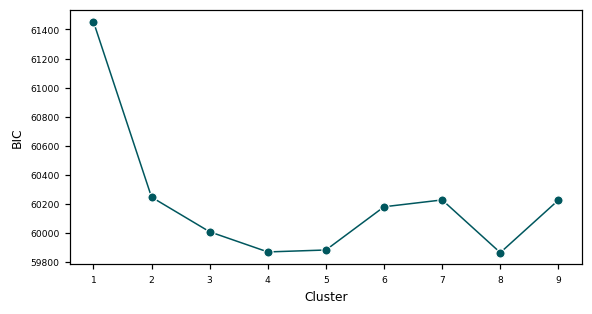

In [ ]:
Cluster_tuning_Gaussian_mix = pd.DataFrame({'Cluster': range(1, 10),
                             'BIC': Gaussian_mix_claster_tuning(df, Num_vars, 
                                                                max_cluster = 10)})

with plt.rc_context(rc = {'figure.dpi': 110, 'axes.labelsize': 8, 
                          'xtick.labelsize': 6, 'ytick.labelsize': 6}):
    
    fig_7, ax_7 = plt.subplots(1, 1, figsize = (6, 3))

    sns.lineplot(x = Cluster_tuning_Gaussian_mix['Cluster'], 
                 y = Cluster_tuning_Gaussian_mix['BIC'], 
                 color = '#00575e', marker = 'o', linewidth = 1)
          
    plt.show()

In [ ]:
Gaussian_model = GaussianMixture(n_components = 3, covariance_type = 'full')
df['Gaussian_mixture'] = Gaussian_model.fit_predict(df[Num_vars])

In [ ]:
def K_means_clastering(df_train, Vars_list, n_clusters = 10):
    
    ### Scaling data
    
    scaler = StandardScaler()
    df_train_scaled = scaler.fit_transform(df_train[Vars_list])
    
    ### Initiating KMeans algorithm
    
    kmeans = KMeans(n_clusters = n_clusters, init = 'k-means++', random_state = 999)
    
    ### Getting clusters
    
    kmeans_results = kmeans.fit_predict(df_train_scaled)
    
    ### Saving results
    
    df_clusters_train = pd.DataFrame({'Cluster': kmeans_results})

    return df_clusters_train

df['K_means'] = K_means_clastering(df, Num_vars, n_clusters = 3)['Cluster']

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


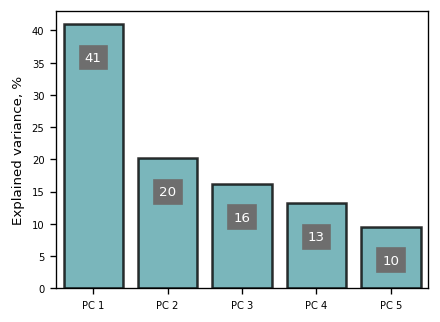

In [ ]:
PCA_variance = pd.DataFrame({'Explained variance, %': 
                             PCA_results[0].explained_variance_ratio_*100})

with plt.rc_context(rc = {'figure.dpi': 120, 'axes.labelsize': 8, 
                          'xtick.labelsize': 6, 'ytick.labelsize': 6}):
    
    fig_5, ax_5 = plt.subplots(1, 1, figsize = (4, 3))

    bar = sns.barplot(x = ['PC ' + str(i) for i in range(1, 6)], 
                      y = PCA_variance['Explained variance, %'],
                      linewidth = 1.5, edgecolor = 'k', color = '#4bafb8', 
                      alpha = 0.8)
    
    ### Annotations
    
    for p in bar.patches:
        
        bar.annotate(format(p.get_height(), '.0f'), 
                     (p.get_x() + p.get_width() / 2, p.get_height()), 
                      ha = 'center', va = 'center', size = 8, color = 'w',
                      xytext = (0, -20), textcoords = 'offset points',
                      bbox = dict(boxstyle = 'square, pad = 0.4', 
                                  fc = '#6e6e6e', lw = 1, ec = '#6e6e6e'))
    
          
    plt.show()

In [ ]:
Num_vars=['Daily Time Spent on Site','Age','Area Income','Daily Internet Usage','Ad Topic Line']
pd.DataFrame(PCA_results[0].components_, columns = df[Num_vars].columns,
index = ['PC 1', 'PC 2', 'PC 3', 'PC 4', 'PC 5']).round(2).T           

,PC 1,PC 2,PC 3,PC 4,PC 5
Daily Time Spent on Site,0.04,0.98,-0.20,-0.02,-0.04
Age,-0.55,0.01,0.03,0.53,-0.65
Area Income,0.45,-0.13,-0.64,0.61,0.09
Daily Internet Usage,-0.42,-0.15,-0.75,-0.49,-0.07
Ad Topic Line,-0.56,0.07,0.02,0.33,0.75


When K=2:

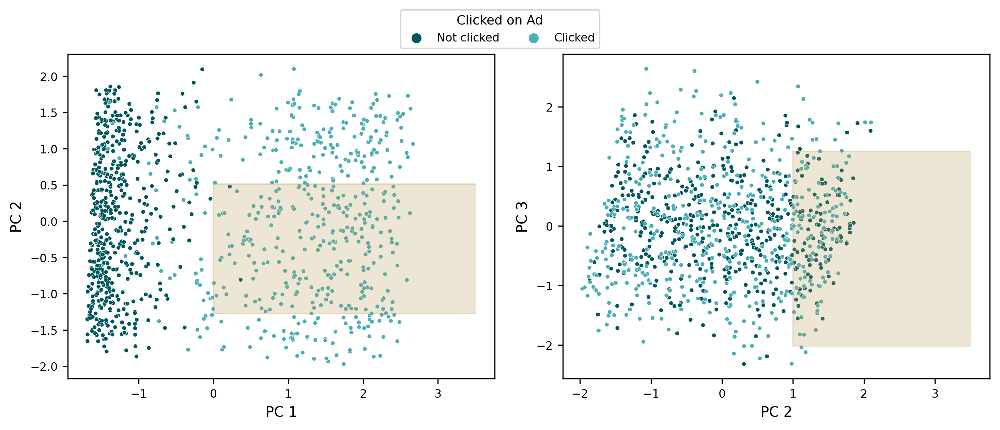

In [ ]:
PCA_scores = pd.DataFrame(PCA_results[1], columns = ['PC 1', 'PC 2', 'PC 3', 'PC 4', 'PC 5'])

with plt.rc_context(rc = {'figure.dpi': 300, 'axes.labelsize': 10, 
                          'xtick.labelsize': 8, 'ytick.labelsize': 8, 
                          'legend.fontsize': 7, 'legend.title_fontsize': 8}):
    
    fig_6, ax_6 = plt.subplots(1, 2, figsize = (10, 4))
    
    ### PC 1 & PC 2
    
    sns.scatterplot(ax = ax_6[0], x = PCA_scores['PC 1'], y = PCA_scores['PC 2'], 
                    hue = df['Clicked on Ad'], palette = my_palette , s = 9)
    
    ax_6[0].get_legend().remove()
    
    ax_6[0].axvspan(xmin = 0, xmax = 3.5, 
                    ymin = 0.2, ymax = 0.6, 
                    alpha = 0.25, color = '#ba9e59')
    
    ### PC 2 & PC 3
    
    sns.scatterplot(ax = ax_6[1], x = PCA_scores['PC 2'], y = PCA_scores['PC 3'], 
                    hue = df['Clicked on Ad'], palette = my_palette, s = 9)
    
    ax_6[1].get_legend().remove()
    
    ax_6[1].axvspan(xmin = 1, xmax = 3.5, 
                    ymin = 0.1, ymax = 0.7, 
                    alpha = 0.25, color = '#ba9e59')
    
    ### A global legend
    
    handles, labels = ax_6[1].get_legend_handles_labels()
    fig_6.legend(handles, labels, loc = 'upper center', 
                 bbox_to_anchor = (0.5, 1.07), ncol = 2, 
                 fontsize = 8, title = 'Clicked on Ad', title_fontsize = 9)
    
    plt.tight_layout(pad = 1.5)
    plt.show()

When K=3:

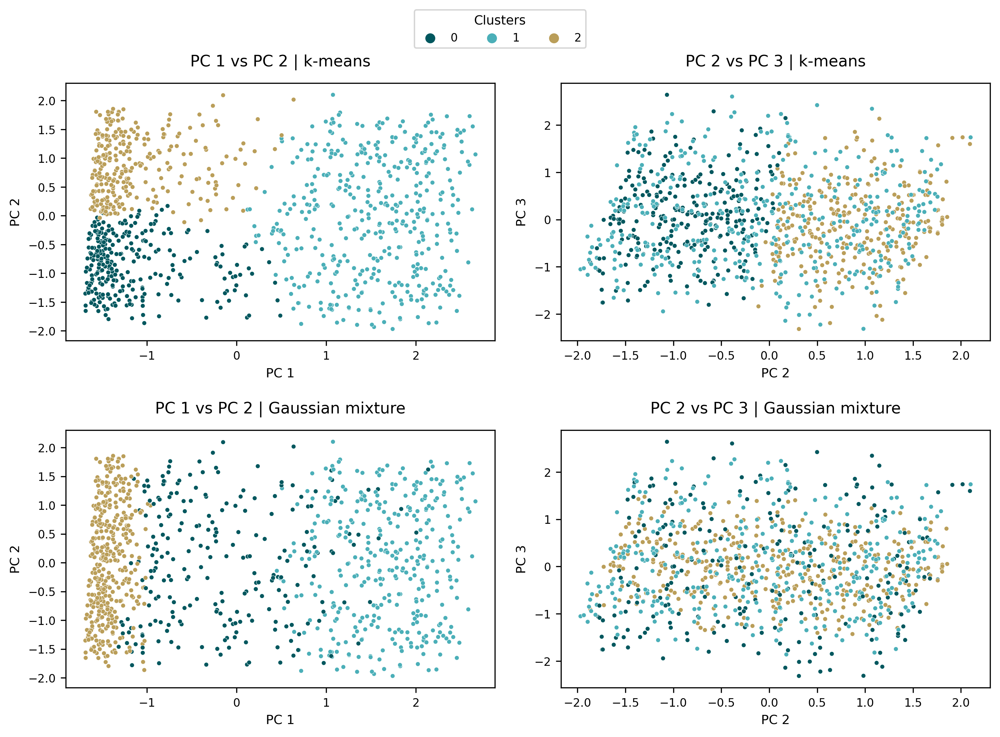

In [ ]:
my_palette_2 = ['#00575e', '#4bafb8', '#ba9e59']

with plt.rc_context(rc = {'figure.dpi': 300, 'axes.labelsize': 9, 
                          'xtick.labelsize': 8, 'ytick.labelsize': 8}):
    
    fig_9, ax_9 = plt.subplots(2, 2, figsize = (10, 7))
    
    ax_9 = ax_9.flatten()
    
    ### PC 1 & PC 2 | PC 2 & PC 3 | k-means
    
    sns.scatterplot(ax = ax_9[0], x = PCA_scores['PC 1'], y = PCA_scores['PC 2'], 
                    hue = df['K_means'], palette = my_palette_2, s = 10)
    
    ax_9[0].get_legend().remove()
    ax_9[0].set_title('PC 1 vs PC 2 | k-means', 
                      fontsize = 11, pad = 12)
    
    sns.scatterplot(ax = ax_9[1], x = PCA_scores['PC 2'], y = PCA_scores['PC 3'], 
                    hue = df['K_means'], palette = my_palette_2, s = 10)
    
    ax_9[1].get_legend().remove()
    ax_9[1].set_title('PC 2 vs PC 3 | k-means', 
                      fontsize = 11, pad = 12)
    
    ### PC 1 & PC 2 | PC 2 & PC 3 | Gaussian mixture
    
    sns.scatterplot(ax = ax_9[2], x = PCA_scores['PC 1'], y = PCA_scores['PC 2'], 
                    hue = df['Gaussian_mixture'], palette = my_palette_2, s = 10)
    
    ax_9[2].get_legend().remove()
    ax_9[2].set_title('PC 1 vs PC 2 | Gaussian mixture', 
                      fontsize = 11, pad = 12)
    
    sns.scatterplot(ax = ax_9[3], x = PCA_scores['PC 2'], y = PCA_scores['PC 3'], 
                    hue = df['Gaussian_mixture'], palette = my_palette_2, s = 10)
    
    ax_9[3].get_legend().remove()
    ax_9[3].set_title('PC 2 vs PC 3 | Gaussian mixture', 
                      fontsize = 11, pad = 12)
    
    ### A global legend
    
    handles, labels = ax_9[1].get_legend_handles_labels()
    fig_9.legend(handles, labels, loc = 'upper center', 
                 bbox_to_anchor = (0.5, 1.04), ncol = 3, 
                 fontsize = 8, title = 'Clusters', title_fontsize = 9)
    
    plt.tight_layout(pad = 1.5)
    plt.show()

When K=4:

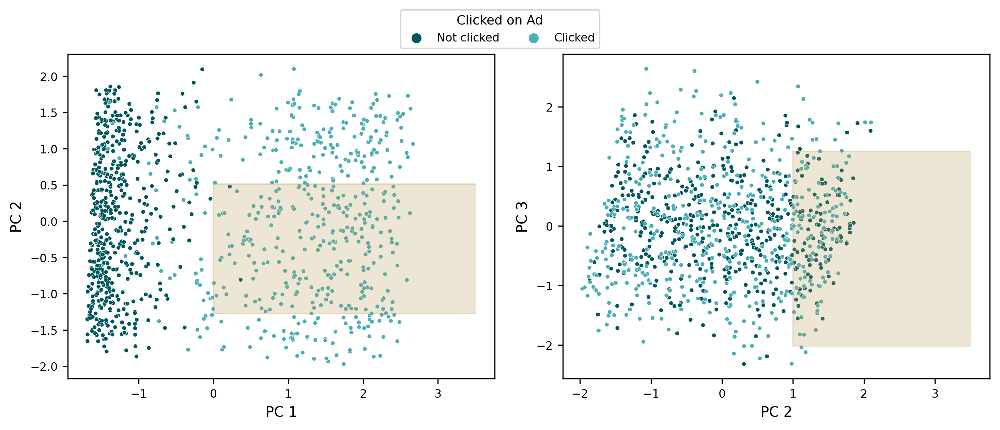

In [ ]:
PCA_scores = pd.DataFrame(PCA_results[1], columns = ['PC 1', 'PC 2', 'PC 3', 'PC 4', 'PC 5'])

with plt.rc_context(rc = {'figure.dpi': 300, 'axes.labelsize': 10, 
                          'xtick.labelsize': 8, 'ytick.labelsize': 8, 
                          'legend.fontsize': 7, 'legend.title_fontsize': 8}):
    
    fig_6, ax_6 = plt.subplots(1, 2, figsize = (10, 4))
    
    ### PC 1 & PC 2
    
    sns.scatterplot(ax = ax_6[0], x = PCA_scores['PC 1'], y = PCA_scores['PC 2'], 
                    hue = df['Clicked on Ad'], palette = my_palette , s = 9)
    
    ax_6[0].get_legend().remove()
    
    ax_6[0].axvspan(xmin = 0, xmax = 3.5, 
                    ymin = 0.2, ymax = 0.6, 
                    alpha = 0.25, color = '#ba9e59')
    
    ### PC 2 & PC 3
    
    sns.scatterplot(ax = ax_6[1], x = PCA_scores['PC 2'], y = PCA_scores['PC 3'], 
                    hue = df['Clicked on Ad'], palette = my_palette, s = 9)
    
    ax_6[1].get_legend().remove()
    
    ax_6[1].axvspan(xmin = 1, xmax = 3.5, 
                    ymin = 0.1, ymax = 0.7, 
                    alpha = 0.25, color = '#ba9e59')
    
    ### A global legend
    
    handles, labels = ax_6[1].get_legend_handles_labels()
    fig_6.legend(handles, labels, loc = 'upper center', 
                 bbox_to_anchor = (0.5, 1.07), ncol = 4, 
                 fontsize = 8, title = 'Clicked on Ad', title_fontsize = 9)
    
    plt.tight_layout(pad = 1.5)
    plt.show()

df_train_scaled [[-1.73031962  0.24926659 -0.11490498  0.50969109  1.73403   ]
 [-1.72685552  0.96113227 -0.57042523  1.00253021  0.31380538]
 [-1.72339142  0.28208309 -1.13982553  0.35694859  1.28758905]
 ...
 [ 1.72339142 -0.84377541  1.707176   -0.93857029 -1.35892388]
 [ 1.72685552 -0.59638946 -1.93698596 -0.97548353  0.18117208]
 [ 1.73031962 -1.26155474 -1.13982553 -1.87383208 -0.0376045 ]]


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 2 
The average silhouette_score is : 0.33953618678110564


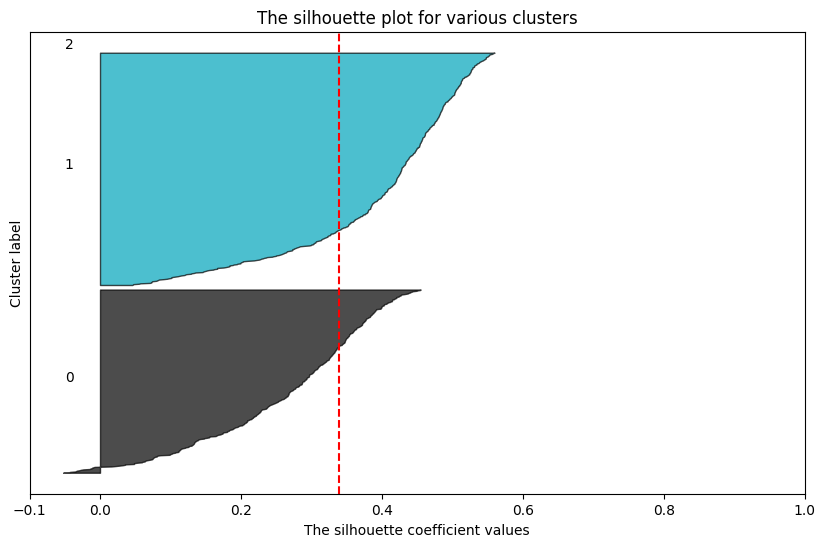

In [ ]:
import matplotlib.cm as cm
from sklearn.metrics import silhouette_score,silhouette_samples

scaler = StandardScaler()
print("df_train_scaled",df_train_scaled)
#df_train_scaled = float(scaler.fit_transform(df[Num_vars]) )

clusterer = KMeans(n_clusters=2,random_state=1)
cluster_labels = clusterer.fit_predict(df_train_scaled)
silhouette_avg = silhouette_score(df_train_scaled, cluster_labels)
df_clusters_train = pd.DataFrame({'Cluster': cluster_labels})
x = silhouette_score(df_train_scaled,cluster_labels)

#print(x,"x")
print("For n_clusters =", 2,  "\nThe average silhouette_score is :", silhouette_avg)

# Compute the silhouette scores for each sample
sample_silhouette_values = silhouette_samples(df_train_scaled, cluster_labels)
fig, ax1 = plt.subplots(figsize=(10,6))

y_lower = 10
for i in range(3):
    # Aggregate the silhouette scores for samples belonging to
    # cluster i, and sort them
    ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
    ith_cluster_silhouette_values.sort()

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    
    color = cm.nipy_spectral(float(i) / 3)
    ax1.fill_betweenx(np.arange(y_lower, y_upper),0, ith_cluster_silhouette_values, facecolor=color, edgecolor="black", alpha=0.7)
    
    # Label the silhouette plots with their cluster numbers at the middle
    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    
    # Compute the new y_lower for next plot
    y_lower = y_upper + 10  # 10 for the 0 samples

ax1.get_yaxis().set_ticks([])
ax1.set_title("The silhouette plot for various clusters")
ax1.set_xlabel("The silhouette coefficient values")
ax1.set_ylabel("Cluster label")
# The vertical line for average silhouette score of all the values
ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 3 
The average silhouette_score is : 0.238860610464596


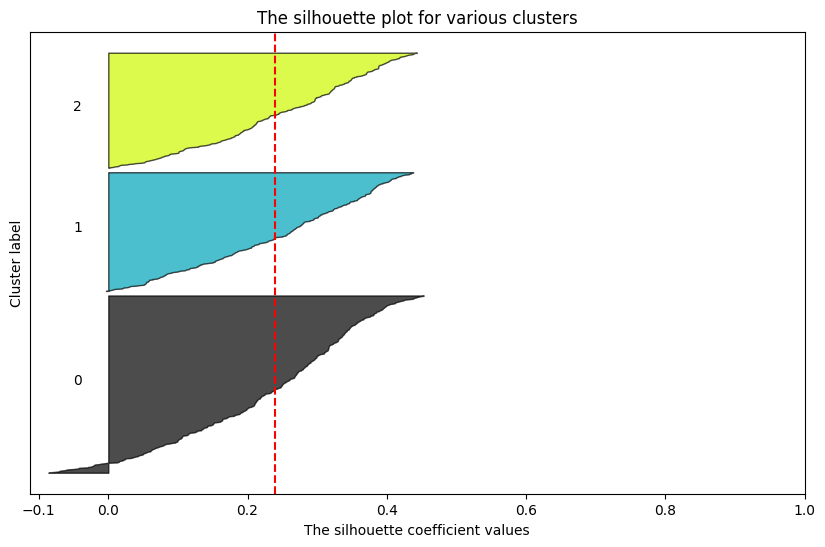

In [ ]:
import matplotlib.cm as cm
from sklearn.metrics import silhouette_score,silhouette_samples

scaler = StandardScaler()
#df_train_scaled = scaler.fit_transform(df[Num_vars])
clusterer = KMeans(n_clusters=3,random_state=1)
cluster_labels = clusterer.fit_predict(df_train_scaled)
silhouette_avg = silhouette_score(df_train_scaled, cluster_labels)
df_clusters_train = pd.DataFrame({'Cluster': cluster_labels})
x = silhouette_score(df_train_scaled,cluster_labels)
#print(x,"x")
print("For n_clusters =", 3,  "\nThe average silhouette_score is :", silhouette_avg)


# Compute the silhouette scores for each sample
sample_silhouette_values = silhouette_samples(df_train_scaled, cluster_labels)
#print("sample",sample_silhouette_values)
fig, ax1 = plt.subplots(figsize=(10,6))

y_lower = 10
for i in range(3):
    # Aggregate the silhouette scores for samples belonging to
    # cluster i, and sort them
    ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
    ith_cluster_silhouette_values.sort()

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    
    color = cm.nipy_spectral(float(i) / 3)
    ax1.fill_betweenx(np.arange(y_lower, y_upper),0, ith_cluster_silhouette_values, facecolor=color, edgecolor="black", alpha=0.7)
    
    # Label the silhouette plots with their cluster numbers at the middle
    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    
    # Compute the new y_lower for next plot
    y_lower = y_upper + 10  # 10 for the 0 samples

ax1.get_yaxis().set_ticks([])
ax1.set_title("The silhouette plot for various clusters")
ax1.set_xlabel("The silhouette coefficient values")
ax1.set_ylabel("Cluster label")
# The vertical line for average silhouette score of all the values
ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

For n_clusters = 4 
The average silhouette_score is : 0.21893211756024022


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


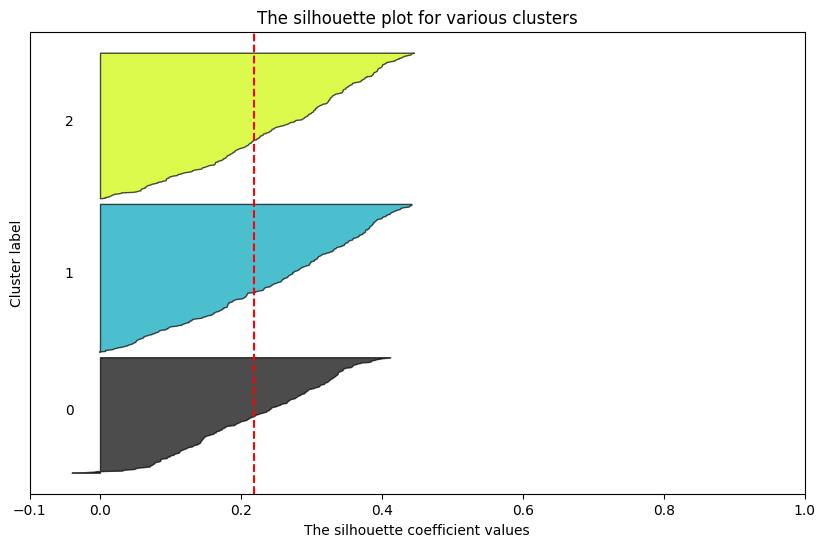

In [ ]:
import matplotlib.cm as cm
from sklearn.metrics import silhouette_score,silhouette_samples

scaler = StandardScaler()
#df_train_scaled = scaler.fit_transform(df[Num_vars])
clusterer = KMeans(n_clusters=4,random_state=1)
cluster_labels = clusterer.fit_predict(df_train_scaled)
silhouette_avg = silhouette_score(df_train_scaled, cluster_labels)
df_clusters_train = pd.DataFrame({'Cluster': cluster_labels})
x = silhouette_score(df_train_scaled,cluster_labels)
#print(x,"x")
print("For n_clusters =", 4,  "\nThe average silhouette_score is :", silhouette_avg)


# Compute the silhouette scores for each sample
sample_silhouette_values = silhouette_samples(df_train_scaled, cluster_labels)
#print("sample",sample_silhouette_values)
fig, ax1 = plt.subplots(figsize=(10,6))

y_lower = 10
for i in range(3):
    # Aggregate the silhouette scores for samples belonging to
    # cluster i, and sort them
    ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
    ith_cluster_silhouette_values.sort()

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    
    color = cm.nipy_spectral(float(i) / 3)
    ax1.fill_betweenx(np.arange(y_lower, y_upper),0, ith_cluster_silhouette_values, facecolor=color, edgecolor="black", alpha=0.7)
    
    # Label the silhouette plots with their cluster numbers at the middle
    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    
    # Compute the new y_lower for next plot
    y_lower = y_upper + 10  # 10 for the 0 samples

ax1.get_yaxis().set_ticks([])
ax1.set_title("The silhouette plot for various clusters")
ax1.set_xlabel("The silhouette coefficient values")
ax1.set_ylabel("Cluster label")
# The vertical line for average silhouette score of all the values
ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

# **- Discussion**

After calculating the average silhouette scores for different values of k, namely k=2, k=3, and k=4, i obtained the following results:

For k=2, the silhouette score is 0.33953618678110564.

For k=3, the silhouette score is 0.238860610464596.

For k=4, the silhouette score is 0.21893211756024022.

Based on these findings, it is evident that k=2 yields the highest silhouette score, indicating the best clustering outcome. This suggests that dividing the data into two distinct clusters provides the most coherent and well-separated grouping of the data points.